# Air Sea Exchange

In [1]:
import xarray as xr
from matplotlib import pyplot as plt
import numpy as np
import gsw
import pooch
import cartopy.crs as ccrs
import hvplot.xarray
import hvplot.pandas
import re

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = (15,9)
plt.rcParams['font.size'] = 16
#plt.rcParams['lines.linewidth'] = 3
from IPython.display import SVG, display, Image, display_svg, YouTubeVideo

opts = dict(geo=True, frame_width=800, frame_height=420, projection=ccrs.Robinson(), coastline=True, legend=False ,features={'land': '110m'})

As anyone who has been to sea knows, the interface between ocean and atmosphere can be an incredibly violent place. Within a hurricane, for example, it is in fact impossible to draw a clear boundary between ocean and atmosphere; the extreme winds whip up a continuous emulsion of air and water. Nevertheless, outside of such extreme cases, there exist robust and relatively simple equations for describing the exchange of heat, freshwater, and momentum between atmosphere and ocean.

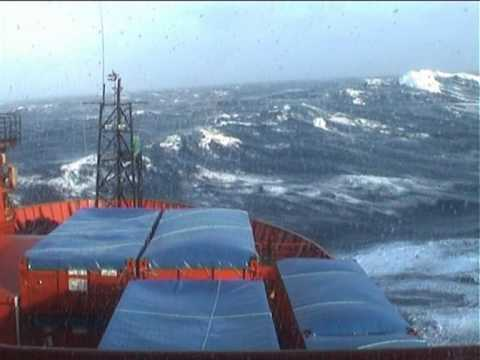

In [2]:
display(YouTubeVideo("BhduxaGtNJ8", width=640, height=480))

## Atmospheric Circulation

Although this is an oceanography class, this topic requires us to know a bit about the atmosphere.
We must have some grasp of the patterns of global atmospheric circulation in order to interpret the patterns of cloud, precipitation, and evaporation which influence air-sea interaction.

### Hadley Circulation

The large-scale atmospheric circulation is shown in this figure:

<img src="https://upload.wikimedia.org/wikipedia/commons/9/9c/Earth_Global_Circulation_-_en.svg" width="80%" />

_Kaidor, CC BY-SA 3.0 <https://creativecommons.org/licenses/by-sa/3.0>, via Wikimedia Commons_

Major important feature of the global circulation include:

- Two overturning ciruclation cells (_Hadley Cells_) centered around the equator:
  - Strong _ascent_ near the equator (Intertropical Convergence Zone; ITCZ), which drives precipitation and cloud cover.
  - Strong _descent_ in the extratropics. The descending air comes from high in the atmosphere and is thus very dry.
    As a result, there is little rain and atmospheric moisture at these latitudes.
    This is why we have deserts.
- Strong westerly winds in midlatitudes
- Strong synoptic-scale storms in midlatitudes. These storms bring heavy wind gusts and precipitation to higher latitudes.

## The Mixed Layer

Our starting point is to consider the ocean surface __mixed layer__ and its coupling with the atmosphere. An important property of the surface ocean is that it nearly always contains a layer of well-mixed (i.e. vertically homogeneous) water overlying the stratified interior (the _thermocline_ / _pycnocline_). This is illustrated in the ARGO profiles shown below.

In [3]:
import fsspec

url = 'https://www.ncei.noaa.gov/data/oceans/argo/gadr/data/atlantic/2015/09/nodc_D1901358_079.nc'
with fsspec.open(url) as fp:
    argo = xr.open_dataset(fp).isel(n_prof=0).load()

In [4]:
argo['s_a'] = gsw.SA_from_SP(argo.psal, argo.pres, argo.longitude, argo.latitude)
argo['c_t'] = gsw.CT_from_t(argo.s_a, argo.temp, argo.pres)
argo['rho'] = gsw.rho(argo.s_a, argo.c_t, argo.pres)
argo['sig0'] = gsw.sigma0(argo.s_a, argo.c_t)
argo['sig2'] = gsw.sigma2(argo.s_a, argo.c_t)
argo['sig4'] = gsw.sigma4(argo.s_a, argo.c_t)
Nsquared, p_mid = gsw.Nsquared(argo.s_a, argo.c_t, argo.pres)

argo_p = argo.swap_dims({'n_levels': 'pres'})
argo_p

<xarray.Dataset>
Dimensions:                       (n_calib: 1, n_history: 4, n_param: 3, pres: 77)
Coordinates:
  * pres                          (pres) float32 6.2 10.3 ... 1.9e+03 1.95e+03
Dimensions without coordinates: n_calib, n_history, n_param
Data variables: (12/70)
    data_type                     object b'Argo profile    '
    format_version                object b'3.1 '
    handbook_version              object b'1.2 '
    reference_date_time           object b'19500101000000'
    date_creation                 object b'20161104225754'
    date_update                   object b'20170714162347'
    ...                            ...
    s_a                           (pres) float64 36.52 36.52 36.52 ... 35.1 35.1
    c_t                           (pres) float64 22.69 22.68 ... 3.299 3.239
    rho                           (pres) float64 1.025e+03 ... 1.037e+03
    sig0                          (pres) float64 25.03 25.04 ... 27.8 27.81
    sig2                          (pres) float64 33.39 33.39 ... 36.93 36.94
    sig4                          (pres) float64 41.39 41.39 ... 45.66 45.67
Attributes: (12/49)
    title:                           Argo float vertical profile
    institution:                     CORIOLIS
    source:                          Argo float
    history:                         2018-06-09T01:59:23Z csun convAGDAC.f90 ...
    references:                      http://www.nodc.noaa.gov/argo/
    user_manual_version:             3.1
    ...                              ...
    time_coverage_end:               2015-09-07T12:29:26Z
    time_coverage_duration:          point
    time_coverage_resolution:        point
    gadr_ConventionVersion:          GADR-3.0
    gadr_program:                    convAGDAC.f90
    gadr_programVersion:             1.0

In [5]:
fig, ax = plt.subplots(ncols=3, figsize=(15,6))
argo_p.temp.plot(y='pres', ax=ax[0], yincrease=False, label='T')
argo_p.c_t.plot(y='pres', ax=ax[0], yincrease=False, label=r'$\Theta$')
ax[0].set_xlabel('[deg. C]')
argo_p.psal.plot(y='pres', ax=ax[1], yincrease=False, label=r'$S_p$')
argo_p.s_a.plot(y='pres', ax=ax[1], yincrease=False, label=r'$S_A$')
ax[1].set_xlabel('[PSU / g/kg]')
argo_p.sig0.plot(y='pres', ax=ax[2], yincrease=False, label=r'$\sigma_0$')
ax[2].set_xlabel('[kg/m^3]')

[a.set_ylim([500,0]) for a in ax]
[a.set_ylabel(r'$p$ (dbar)') for a in ax]
[a.legend() for a in ax]
[a.grid() for a in ax]
fig.suptitle('ARGO Float ID %s : %g lon, %g lat' % (argo.id, argo.longitude, argo.latitude))
plt.tight_layout()
plt.close()

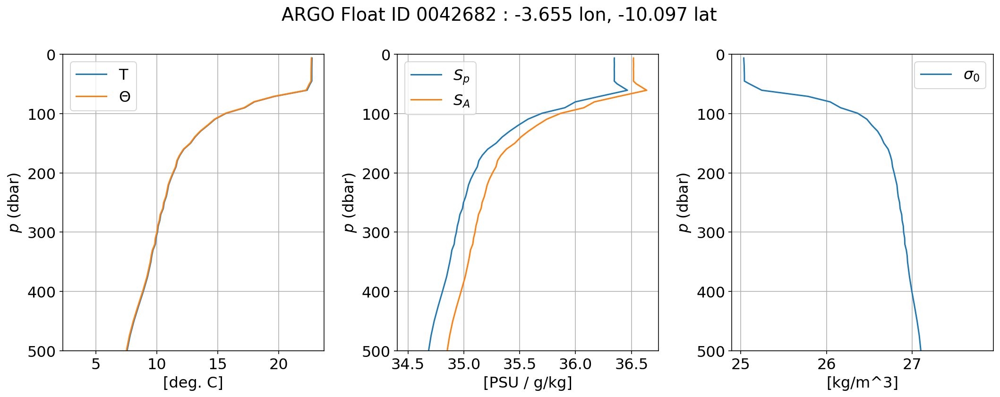

In [6]:
fig

The mixed layer exists primarily because of the winds; the winds generate surface waves which break, and the resulting turbulence homogenizes the properties of the near-surface water.

Generally speaking, the stronger the winds, the deeper the mixed layer. However, buoyancy fluxes can also help determine the mixed layer depth. In winter, strong cooling causes the surface water to become denser than the underlying water. This triggers turbulent convection which deepens the mixed layer.

In [7]:
url = 'http://mixedlayer.ucsd.edu/data/Argo_mixedlayers_monthlyclim_03172021.nc'
file_path = pooch.retrieve(url, known_hash=None)

In [8]:
mld = xr.open_dataset(file_path)
mld = mld.swap_dims({'iLON': 'lon', 'iLAT': 'lat', 'iMONTH': 'month'})
mld

<xarray.Dataset>
Dimensions:        (lat: 180, lon: 360, month: 12)
Coordinates:
  * lat            (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon            (lon) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * month          (month) float64 1.0 2.0 3.0 4.0 5.0 ... 9.0 10.0 11.0 12.0
Data variables: (12/17)
    mld_da_mean    (lat, lon, month) float64 ...
    mld_dt_mean    (lat, lon, month) float64 ...
    mld_da_median  (lat, lon, month) float64 ...
    mld_dt_median  (lat, lon, month) float64 ...
    mld_da_std     (lat, lon, month) float64 ...
    mld_dt_std     (lat, lon, month) float64 ...
    ...             ...
    mlt_dt         (lat, lon, month) float64 ...
    mls_da         (lat, lon, month) float64 ...
    mls_dt         (lat, lon, month) float64 ...
    num            (lat, lon, month) float64 ...
    longrid        (lat, lon) float64 ...
    latgrid        (lat, lon) float64 ...
Attributes:
    description:  This file was created using \n matlab R2011b with NETCDF Li...
    date:         [730848.53015047 730848.88790506 730849.28543982 ... 738207...

In [9]:
mld.mld_da_max.hvplot('lon', 'lat', clim=(0, 500), label='Maximum Mixed Layer Depth', cmap='Viridis', **opts)

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


:DynamicMap   [month]
   :Overlay
      .Land.I                          :Feature   [Longitude,Latitude]
      .Image.Maximum_Mixed_Layer_Depth :Image   [lon,lat]   (mld_da_max)
      .Coastline.I                     :Feature   [Longitude,Latitude]

### Simple 1D Model

The mixed layer is the part of the ocean that is in direct contact with the atmosphere, and so our equations for air-sea interaction are equations for the evolution of the mixed layer. For the sake of simplicity, we will begin by considering just a one-dimensional model, where all exchange is in the vertical. (In other words, we will not consider lateral exchanges of heat and salt within the mixed layer.) Furthermore, we will assume that the mixed layer is totally isolated from the thermocline and does not exchange heat and salt with the water below. Both these assumptions are unrealistic, but they are a useful starting point.

In this model, the mixed layer thermodynamic state is characterized by three fundamental state variables: $\Theta$ (conservative temperature), $S_A$ (absolute salinity),  and $h$, the mixed layer depth. Through the equation of state, $\Theta$ and $S_A$ determine the mixed layer potential density. (The pressure is irrelevant for now, but in this 1D model, it is simply proportional to depth.) We now describe how air-sea exchange influences the evolution of $\Theta$ and $S_A$.



## Heat Exchange

The heat content of the mixed layer (per unit area) is given by.

$$\mathcal{H} = h \rho c_p^0 \Theta $$

If the mixed layer is isolated from the interior, the first law of thermodynamics can be written as

$$ \frac{d \mathcal{H}}{dt} = Q $$

where $Q$ is the __air-to-sea heat flux__.


Because density $\rho$ only changes by a about 0.1% during air-sea interaction, it is reasonable to approximate $\rho \simeq \rho_0$. If we further assume that the mixed layer depth $h$ doesn't change, we can write the heat equation as

$$ \frac{d \Theta}{d t} = \frac{Q}{h \rho_0 c_p^0} $$

### Components of the Heat Flux ###

We divide the heat flux $Q$ into four separate components associated with different physical processes.

$$
Q = \underbrace{Q_{sw}}_\text{shortwave radiation} + \underbrace{Q_{lw}}_\text{longwave radiation} + \underbrace{Q_{sh}}_\text{sensible heat flux} + \underbrace{Q_{lh}}_\text{latent heat flux} 
$$

In [10]:
registry = {
    "hfns11a.nc.Z": None,
    "hfls11a.nc.Z": None,
    "hfss11a.nc.Z": None,
    "rss11a.nc.Z": None,
    "rls11a.nc.Z": None
}
POOCH = pooch.create(
    path=pooch.os_cache("Grist_Josey_2003"),
    base_url="ftp://ftp.noc.soton.ac.uk/pub/sxj/clim/netcdf/",
    registry=registry
)

fnames = {fname: POOCH.fetch(fname) for fname in registry}

In [11]:
import unlzw3
def uncompress(input_fname):
    assert input_fname[-2:] == '.Z'
    output_fname = input_fname[:-2]
    with open(input_fname, "rb") as fp:
        uncompressed_data = unlzw3.unlzw(fp.read())
    with open(output_fname, "wb") as fp:
        fp.write(uncompressed_data)
    return output_fname

fnames_uncompressed = [uncompress(f) for f in fnames.values()]

In [12]:
noca = xr.open_mfdataset(fnames_uncompressed, combine='by_coords')
noca = noca.assign_coords({'month': noca.time.dt.month}).swap_dims({'time': 'month'})
noca

/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/coding/times.py:119: SerializationWarning: Ambiguous reference date string: 2-1-1 0. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0002-1-1 0). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)
/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/coding/times.py:527: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/core/indexing.py:572: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of ra

<xarray.Dataset>
Dimensions:    (latitude: 170, longitude: 360, month: 12)
Coordinates:
    time       (month) object 0002-01-01 00:00:00 ... 0002-12-01 00:00:00
  * longitude  (longitude) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * latitude   (latitude) float64 -84.5 -83.5 -82.5 -81.5 ... 82.5 83.5 84.5
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Data variables:
    hfls11a    (month, latitude, longitude) float32 dask.array<chunksize=(12, 170, 360), meta=np.ndarray>
    hfns11a    (month, latitude, longitude) float32 dask.array<chunksize=(12, 170, 360), meta=np.ndarray>
    hfss11a    (month, latitude, longitude) float32 dask.array<chunksize=(12, 170, 360), meta=np.ndarray>
    rls11a     (month, latitude, longitude) float32 dask.array<chunksize=(12, 170, 360), meta=np.ndarray>
    rss11a     (month, latitude, longitude) float32 dask.array<chunksize=(12, 170, 360), meta=np.ndarray>
Attributes:
    Conventions:  COARDS
    calendar:     standard
    comments:     Climatological estimate based on ship meteorological report...
    model:        
    center:       National Oceanography Centre, Southampton, UK

### Radiative Fluxes

The radiative fluxes in the earth system are often partitioned into a __shortwave__ and __longwave__ component. These names refer to the wavelength of the electromagnetic waves which constitute the radiation. These components occupy very distinct parts of the electromagnetic spectrum. Radiation emitted from the sun is shortwave radiation, while radiation emitted from the earth itself is longwave radiation. The dramatic difference in wavelengths emitted from each body is a result of [Planck's law of blackbody radiation](http://en.wikipedia.org/wiki/Black-body_radiation), which describes how the emission wavelength depends on temperature. Solar radiation has a shorter wavelength than terrestrial because the sun is much hotter than the earth.

In [13]:
Image(url="https://upload.wikimedia.org/wikipedia/commons/7/7c/Atmospheric_Transmission.png")

Atmospheric Transmission. Licensed CC BY-SA 3.0 [Creative Commons Attribution-Share Alike 3.0](http://creativecommons.org/licenses/by-sa/3.0/)

Via [Wikimedia Commons](https://commons.wikimedia.org/wiki/File:Atmospheric_Transmission.png)

In [14]:
Image(url="https://upload.wikimedia.org/wikipedia/commons/b/bb/"
      "The-NASA-Earth%27s-Energy-Budget-Poster-Radiant-Energy-System-satellite-infrared-radiation-fluxes.jpg")

By [NASA](http://science-edu.larc.nasa.gov/energy_budget/), Public domain. Via [Wikimedia Commons](https://commons.wikimedia.org/wiki/File%3AThe-NASA-Earth's-Energy-Budget-Poster-Radiant-Energy-System-satellite-infrared-radiation-fluxes.jpg)

### Shortwave Radiation

The average value of incoming solar radiation at the top of Earth's atmosphere is 342 W m$^{-2}$, although this value varies considerably with latitude and season. Some of the solar radiation is absorbed by the atmosphere or reflected back to space by clouds and aerosols, never reaching the ocean. Furthermore, the ocean doesn't absorb all of the shortwave radiation that reaches its surface; some is also reflected back to space. The __albedo__ $\alpha$ describes how much radiation is absorbed versus reflected. Therefore, the shortwave heating is given by

$$ Q_{sw} = (1 - \alpha)Q^{inc}_{sw} $$

where $Q^{inc}_{sw}$ is the incident shortwave radiation.

#### Albedo

An albedo of 0 means that all of the incident radiation is absorbed. The ocean's average albedo is about 0.06, although it does vary somewhat depending on sea state. This relatively low albedo means that the ocean is a very effective absorber of radiation, especially compared to ice. The strong change in albedo that occurs when the high-latitude ocean freezes is melts is therefore a significant climate feedback.

In [15]:
Image(url='https://upload.wikimedia.org/wikipedia/commons/e/e2/Ceres_2004_clear_sky_albedo.png', width=800)

By Giorgiogp2 (Own work). License [CC BY-SA 3.0](http://creativecommons.org/licenses/by-sa/3.0) or [GFDL](http://www.gnu.org/copyleft/fdl.html), via [Wikimedia Commons](https://commons.wikimedia.org/wiki/File:Ceres_2004_clear_sky_albedo.png)


In [16]:
noca.rss11a.hvplot('longitude', 'latitude', clim=(-300, 300), label=noca.rss11a.long_name, cmap='RdBu_r', **opts)

:DynamicMap   [month]
   :Overlay
      .Land.I                                                                                                       :Feature   [Longitude,Latitude]
      .Image.Heat_flux_net_shortwave_surface_left_parenthesis_Positive_for_heat_gain_by_the_ocean_right_parenthesis :Image   [longitude,latitude]   (rss11a)
      .Coastline.I                                                                                                  :Feature   [Longitude,Latitude]

In [17]:
df_zm = noca.fillna(0.).mean(dim=('month', 'longitude')).to_dataframe()
new_columns = {v: re.sub(r'Heat flux (.*) surface \(.*', r'\1', noca[v].long_name) for v in noca.data_vars}
df_zm = df_zm.rename(columns=new_columns)
df_zm.head()

,latent,net,sensible,net longwave,net shortwave
latitude,,,,,
-84.5,0.0,0.0,0.0,0.0,0.0
-83.5,0.0,0.0,0.0,0.0,0.0
-82.5,0.0,0.0,0.0,0.0,0.0
-81.5,0.0,0.0,0.0,0.0,0.0
-80.5,0.0,0.0,0.0,0.0,0.0


In [18]:
df_zm.hvplot.line(x='latitude', y='net shortwave', line_width=4, grid=True, legend='top')

:Curve   [latitude]   (net shortwave)

### Longwave Radiation

Because of its much lower temperature, the earth emits radiation in the longwave (i.e. infrared) band. On a global scale, emission is the main way the planet balances the incoming solar radiation to maintain its thermal equilibrium. The power of emitted radiation is strongly dependent on temperature; specifically, the Stefan-Boltzman law states that


$$ Q_{lw}^{emitted} = - \sigma T^4 $$

where $\sigma = 5.67 \times 10^-8$ W m$^{-2}$ K$^{-4}$ is the Stefan-Boltzman constant. (It is important to remember to use absolute temperature in deg. Kelvin when evaluating this formula.) Here we have chosen to maintain the same sign convention for longwave radiation as for shortwave. 


$Q_{lw}^{emitted}$ is not the only contribution to the longwave flux. The atmosphere also emits longwave radiation itself, and some of this radiation is absorbed by the ocean. There is a large amount of cancellation between these two components, but in the net
The fact that $Q_{lw}$ is negative definite means that longwave emissions acts to cool the ocean.

Longwave cooling is indeed a significant sink of heat from the ocean. The mean value of the longwave cooling is around -50 W m$^{-2}$.

In [19]:
noca.rls11a.hvplot('longitude', 'latitude', clim=(-100, 100), label=noca.rls11a.long_name, cmap='RdBu_r', **opts)

:DynamicMap   [month]
   :Overlay
      .Land.I                                                                                                      :Feature   [Longitude,Latitude]
      .Image.Heat_flux_net_longwave_surface_left_parenthesis_Positive_for_heat_gain_by_the_ocean_right_parenthesis :Image   [longitude,latitude]   (rls11a)
      .Coastline.I                                                                                                 :Feature   [Longitude,Latitude]

In [20]:
df_zm.hvplot.line(x='latitude', y=['net shortwave', 'net longwave'], line_width=4, grid=True, legend='top', height=400)

:NdOverlay   [Variable]
   :Curve   [latitude]   (value)

### Sensible Heat Flux

Radiative fluxes transmit heat energy over long distances, e.g.~from the sun to the earth. Sensible heat exchange instead depends on direct molecular contact between air and water. The molecules of the two fluids bump against each other, thereby exchanging heat energy. When the ocean and air temperature are the same, the sensible heat flux is therefore zero. When they differ, heat is exchanged in such as way as to homogenize the temperature. This is analogous to the phenomenon of "Newtonian cooling'' commonly studied in introductory physics courses.


The rate of exchange is highly dependent on the sea state, and in particular on the winds, which generate breaking waves and turbulence. It is easy to imagine how breaking waves enhance the exchange of heat: they literally pull air down into the water (bubbles) and splash water up into the air (sea spray). It is much harder to quantify this process mathematically. Nevertheless, laboratory experiments and field campaigns have permitted us to develop empirical formulas to do so.

#### Bulk Formula

The commonly accepted formula for sensible heat flux is

$$
Q_s = \rho^{air} c_p^{air} C_H | \Delta \mathbf{u} | (T_{10} - T) \ .
$$

The subscript $_{10}$ refers to the properties of air at 10 m altitude ($T_{10}$ is air temperature at 10 m). Although this height is somewhat arbitrary, it is a widely-used convention. $\Delta \mathbf{u} = \mathbf{u}_{10} - \mathbf{u}$ refers to the difference between the wind speed at 10 m and the ocean current speed. $c_p^{air} = 1030$ J kg$^{-1}$ K$^{-1}$ is the specific heat of air and $\rho^{air}$ is the density of air (approximately $1.3$ kg m$^{-3}$). Note it is the in-situ temperature $T$, _not conservative temperature_, which appears in the bulk formula.

#### Drag Coefficient ###

All of the complexity and difficulty of turbulent air-sea exchange is absorbed into the parameter $C_H$, the turbulent __transfer coefficient__ for sensible heat exchange. This non-dimensional coefficient is $O(1000)$ but is a strongly nonlinear function of $|\Delta \mathbf{u}|$. It also depends on the stability of the stratification within the atmospheric boundary layer. The figure below illustrates this dependence.

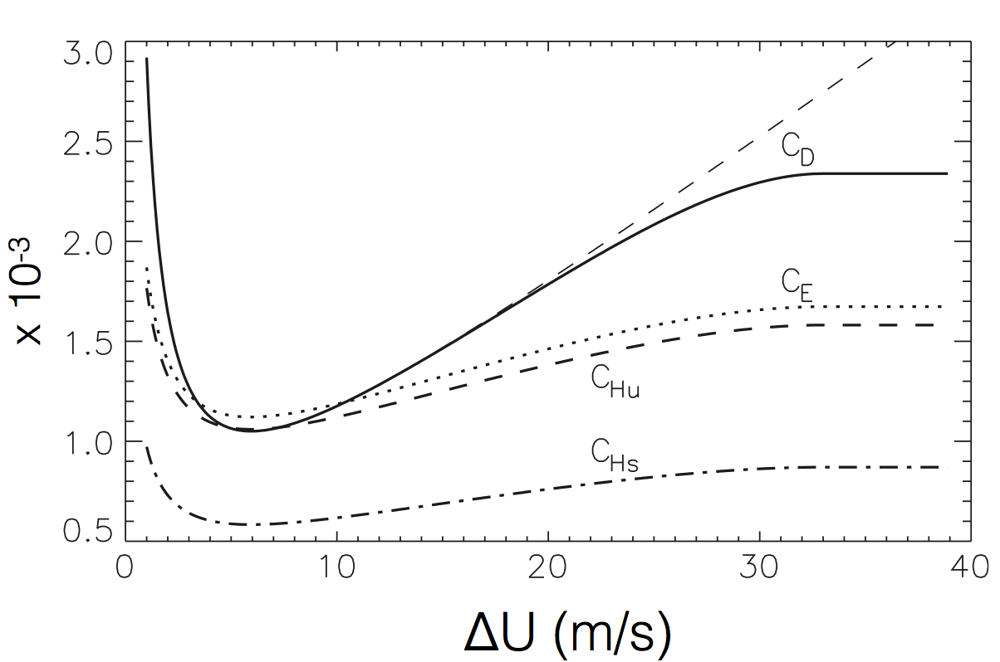

In [21]:
Image(filename='04_images/LY09_Drag_Coefficient.png', width=800)

Turbulent transfer coefficients as a function of wind speed, taken from Large and Yeager (2009). Note that $C_H$ is different in stable, ($C_{H_s}$) and unstable ($C_{H_u}$) atmospheric stratification.

For strong winds, $C_H$ is a positive function of $|\Delta \mathbf{u}|$. But as $ | \Delta \mathbf{u} | $ approaches zero, $C_H$ actually increases very rapidly. This means that the heat exchange doesn't necessarily vanish for very weak winds, as one might mistakenly conclude from the figure. Further refining our description of $C_H$, especially for extremely strong winds (i.e.~within hurricanes) is an ongoing topic of study for air-sea-interaction researchers.

In [22]:
noca.hfss11a.hvplot('longitude', 'latitude', clim=(-100, 100), label=noca.hfss11a.long_name, cmap='RdBu_r', **opts)

:DynamicMap   [month]
   :Overlay
      .Land.I                                                                                                  :Feature   [Longitude,Latitude]
      .Image.Heat_flux_sensible_surface_left_parenthesis_Positive_for_heat_gain_by_the_ocean_right_parenthesis :Image   [longitude,latitude]   (hfss11a)
      .Coastline.I                                                                                             :Feature   [Longitude,Latitude]

In [23]:
df_zm.hvplot.line(x='latitude', y=['net shortwave', 'net longwave', 'sensible'], line_width=4, grid=True, legend='top', height=400)

:NdOverlay   [Variable]
   :Curve   [latitude]   (value)

The annual mean contribution of $Q_s$ to $Q$ is almost negligible. This is because, on average, the $T$ and $T_{10}$ are very close. There is, however, a strong seasonal cycle in sensible heat exchange. Because of the large ocean heat capacity, the ocean is usually colder than the air in summer and warmer than the air in the winter. This drives important seasonal changes in circulation.

### Latent Heat Flux



The latent heat flux is produced when seawater evaporates to become atmospheric water vapor. This process requires thermodynamic energy and therefore extracts heat from the ocean. The latent heat flux is given by

$$ Q_{lh} = -L_e E $$

where $E$ is the evaporation rate (in kg m$^{-2}$ s$^{-1}$), and $L_e \simeq 2.5 \times 10^6$ J kg$^{-1}$ is the latent heat of vaporization. The fact that $Q_{lh}$ is negative is due to our sign convention: the latent heat flux always cools the ocean

#### Evaporation Rate

What sets the evaporation rate $E$? As with sensible heat, evaporation is a turbulent exchange which depends on direct molecular contact between air and water. It is given by another bulk formula:

$$ E = - \rho^{air} c_E | \Delta \mathbf{u} | (q_{10} - q_{sat}) $$

where $q_{10}$ and $q_{sat}$ refer, respectively, to the specific humidity of the air at 10 m and the saturation specific humidity right at the sea surface, and $c_E$ is the exchange coefficient for water vapor. Specific humidity measures the mass fraction of water vapor in air. It is a non-dimensional unit but is frequently reported as g kg$^{-1}$ (grams of water per kilogram of air).



#### Saturation Specific Humidty

The maximum amount of water vapor that it can hold is called the __saturation specific humidity__. This quantity is an exponential function of the air temperature. The relationship between $q_{sat}$ and temperature is given by the __Clausius-Clapeyron relation__. A practical formula for evaluating the Clausius-Clapeyron relation over the ocean is

$$
q_{sat}(T) = 0.98 \frac{6.4 \times 10^5 \mbox{ kg m}^{-3}}{\rho^{air}} e^{-(5107.4 K) / T} \ .
$$

Right at the sea-surface, the air is always at the same temperature as the ocean ($T$) and is always completely saturated; that's why $q_{sat}$ is a function of SST. But at 10 m altitude, the air can have a different specific humidity due to atmospheric circulation. If the two values of $q$ are not equal, the ocean will evaporate at rate $E$.


In [24]:
noca.hfls11a.hvplot('longitude', 'latitude', clim=(-200, 200), label=noca.hfls11a.long_name, cmap='RdBu_r', **opts)

:DynamicMap   [month]
   :Overlay
      .Land.I                                                                                                :Feature   [Longitude,Latitude]
      .Image.Heat_flux_latent_surface_left_parenthesis_Positive_for_heat_gain_by_the_ocean_right_parenthesis :Image   [longitude,latitude]   (hfls11a)
      .Coastline.I                                                                                           :Feature   [Longitude,Latitude]

$Q_{lh}$ is the dominant mechanism for cooling the ocean, with an global, annual mean value of close to 100 W m$^{-2}$. $Q_{lh}$ is strongest where strong, dry continental winds blow over the oceans, as occurs near the western boundaries of the midlatitude basins (e.g. over the Gulf Stream).


### Net Air Sea Flux

In [25]:
(df_zm.hvplot.line(x='latitude', y=['net shortwave', 'net longwave', 'sensible', 'latent'], line_width=4, grid=True, legend='top', height=400)
 * df_zm.hvplot.line(x='latitude', y='net', color='black', label='net', legend=True, line_width=6))

:Overlay
   .NdOverlay.I :NdOverlay   [Variable]
      :Curve   [latitude]   (value)
   .Curve.Net   :Curve   [latitude]   (net)

Looking at all the fluxes together, we see that there is strong compensation between shortwave heating and the other processes, which primarily cool the ocean in a mean sense.

The general pattern is **net heat gain in the topics** and **net heat loss near the poles**.
To keep the ocean in a steady state, ocean circulation must therefore transport heat from equator to pole.
There are also important hemispheric aysmmetries: the high-latitude Southern Ocean has regions of significant _net heat gain_.

In [26]:
noca.hfns11a.mean(dim='month').hvplot('longitude', 'latitude', clim=(-200, 200), label=('Annual Mean' + noca.hfns11a.long_name), cmap='RdBu_r', **opts)

/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


:Overlay
   .Land.I                                                                                                        :Feature   [Longitude,Latitude]
   .Image.Annual_MeanHeat_flux_net_surface_left_parenthesis_Positive_for_heat_gain_by_the_ocean_right_parenthesis :Image   [longitude,latitude]   (hfns11a)
   .Coastline.I                                                                                                   :Feature   [Longitude,Latitude]

## Freshwater Fluxes

We have already talked about evaporation in the context of latent heat fluxes.
More generally, the ocean exchanges water with the atmosphere via evaporation, precipitation, and runoff.
These fluxes have a rather negligible impact on the ocean volume, but they have a very strong impact on salinity.

In [27]:
Image(url="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b1/"
      'Diagram_of_the_Water_Cycle.jpg/1024px-Diagram_of_the_Water_Cycle.jpg')

By Ehud Tal (Own work) [CC BY-SA 4.0](http://creativecommons.org/licenses/by-sa/4.0), via Wikimedia Commons
https://commons.wikimedia.org/wiki/File%3ADiagram_of_the_Water_Cycle.jpg


In [28]:
evap = xr.open_dataset('http://kage.ldeo.columbia.edu:81/expert/home/.OTHER/.richard/.whoi/.oaflux/.data_v3/.monthly/.evaporation/.evapr.nc/dods', decode_times=False)
evap.T.attrs['calendar'] = '360_day'
evap = xr.decode_cf(evap)
evap.load()

<xarray.Dataset>
Dimensions:  (T: 688, lat: 180, lon: 360)
Coordinates:
  * T        (T) object 1958-01-16 00:00:00 ... 2015-04-16 00:00:00
  * lat      (lat) float32 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5
Data variables:
    evapr    (T, lat, lon) float32 nan nan nan nan nan ... nan nan nan nan nan
Attributes:
    nco_openmp_thread_number:  1
    Conventions:               IRIDL
    history:                   Tue Jul 21 15:45:00 2015: ncatted -a gridtype,...
    NCO:                       4.3.7

In [29]:
precip = xr.open_dataset('http://iridl.ldeo.columbia.edu/SOURCES/.NASA/.GPCP/.V2p1/.multi-satellite/.prcp/dods', decode_times=False)
precip.T.attrs['calendar'] = '360_day'
precip = xr.decode_cf(precip)
precip.load()

<xarray.Dataset>
Dimensions:  (T: 363, X: 144, Y: 72)
Coordinates:
  * X        (X) float32 1.25 3.75 6.25 8.75 11.25 ... 351.2 353.8 356.2 358.8
  * T        (T) object 1979-01-16 00:00:00 ... 2009-03-16 00:00:00
  * Y        (Y) float32 88.75 86.25 83.75 81.25 ... -81.25 -83.75 -86.25 -88.75
Data variables:
    prcp     (T, Y, X) float32 nan nan nan nan ... 0.1052 0.1064 0.1063 0.1062
Attributes:
    Conventions:  IRIDL

In [30]:
evap_mean = evap.mean(dim='T')
precip_mean = precip.mean(dim='T')

In [31]:
precip_i = -360/10*precip_mean.prcp.rename({'X': 'lon', 'Y': 'lat'}).interp_like(evap)
e_minus_p = precip_i + evap_mean.evapr
e_minus_p

<xarray.DataArray (lat: 180, lon: 360)>
array([[         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       ...,
       [         nan, -17.00304085, -17.07332303, ..., -17.0413101 ,
        -16.95387047,          nan],
       [         nan, -17.10691531, -17.18704079, ..., -16.91647733,
        -16.83511857,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan]])
Coordinates:
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * lon      (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 355.5 356.5 357.5 358.5 359.5

In [32]:
evap_mean.evapr.hvplot('lon', 'lat', clim=(-300, 300), label='Annual Mean Evaporation (cm/year)', cmap='PiYG_r', **opts)

:Overlay
   .Land.I                                                                        :Feature   [Longitude,Latitude]
   .Image.Annual_Mean_Evaporation_left_parenthesis_cm_over_year_right_parenthesis :Image   [lon,lat]   (evapr)
   .Coastline.I                                                                   :Feature   [Longitude,Latitude]

In [33]:
precip_i.hvplot('lon', 'lat', clim=(-300, 300), label='Annual Mean Precipitation (cm/year)', cmap='PiYG_r', **opts)

:Overlay
   .Land.I                                                                          :Feature   [Longitude,Latitude]
   .Image.Annual_Mean_Precipitation_left_parenthesis_cm_over_year_right_parenthesis :Image   [lon,lat]   (prcp)
   .Coastline.I                                                                     :Feature   [Longitude,Latitude]

In [34]:
e_minus_p.hvplot('lon', 'lat', clim=(-200, 200), label='Annual Mean Evaporation - Precipitation (cm/year)', cmap='PiYG_r', **opts)

:Overlay
   .Land.I                                                                                                   :Feature   [Longitude,Latitude]
   .Image.Annual_Mean_Evaporation_hyphen_minus_Precipitation_left_parenthesis_cm_over_year_right_parenthesis :Image   [lon,lat]   (Annual Mean Evaporation - Precipitation (cm/year))
   .Coastline.I                                                                                              :Feature   [Longitude,Latitude]

In [35]:
e_minus_p.rename('Evaporation minus Precipitation').mean('lon').hvplot(x='lat', color='black', line_width=6, grid=True)  * \
evap_mean.evapr.rename('Evaporation').mean('lon').hvplot(x='lat', line_width=4, color='purple') * \
precip_i.rename('Precipitation').mean('lon').hvplot(x='lat', line_width=4, color='green')

:Overlay
   .Curve.I   :Curve   [lat]   (Evaporation minus Precipitation)
   .Curve.II  :Curve   [lat]   (Evaporation)
   .Curve.III :Curve   [lat]   (Precipitation)

The pattern of net evaporation minus precipitation has a more complex structure.
The imprint of the intertropical convergence zone (ITCZ) is clearly visible just north of the equator.
Strong evaporation is dominant in the sub-tropics. At high latitudes, precipitation wins again.
As with heat transport, ocean circulation must transport salt in order to keep salinity in balance with these air-sea fluxes.

### Freshwater and Salinity

The salt stays in the ocean, while freshwater comes in and out through __evaporation__, __precipitation__, and __runoff__ ($E-P-R$). This changes the total mass (and volume) of the ocean ever so slightly.

How does $E-P-R$ affect the ocean salinity? Increasing freshwater dilutes the salinity, and evaporation concentrates it.

### Conservation of Mass / Volume 

The mass of the water column is given by

$$
\int_{-H}^\eta \rho dz
$$

The rate of change of mass is proportional to $E-P-R$. 

$$
\frac{d}{dt} \int_{-H}^\eta \rho dz = -(E - P - R)
$$

To simplify things somewhat, here we will treat seawater density as constant, i.e. $\rho = \rho_0$, allowing us to convert the mass rate of change to volume rate of change

$$
\frac{d}{dt} \int_{-H}^\eta dz = \frac{d \eta}{dt} = - \frac{E - P - R}{\rho_0} \ .
$$


### Conservation of Salt

The total salt mass in the water column is:

$$
\int_{-H}^\eta \rho S dz
$$

Again, approximating density as constant, this simplifies to:

$$
\rho_0 \int_{-H}^\eta S dz
$$

Neglecting lateral transports (which move salt around but can't remove it from the ocean), salt conservation states that

$$
\frac{d}{dt} \int_{-H}^\eta S dz = 0
$$


### Virtual Salt Flux

Derive an expression for how $S$ respond to freshwater fluxes, we use the [Leibniz](https://en.wikipedia.org/wiki/Leibniz_integral_rule) to rearrange the integral.
This rule states that

$$
\frac{d}{dt} \int_{-H}^\eta S dz
= \int_{-H}^\eta \frac{dS}{dt} dz + S(\eta) \frac{d \eta}{d t} - S(H) \frac{d H}{d t}
$$

Since the lower boundary is fixed, the last term is zero. Likewise, from salt conservation, we know that the LHS is zero.
This allows us to obtain

$$
\int_{-H}^\eta \frac{dS}{dt} dz = - S(\eta) \frac{d \eta}{dt} = S(\eta) \frac{E - P - R}{\rho_0}
$$

This tells us that the average salinity of the water column increases at a rate proportional to $E - P - R$. The quantity on the right is often called the _virtual salt flux_ because it plays a similar role to the heat flux. If this flux is felt over the mixed layer, the rate of change of mixed layer salinity is given by

$$
\frac{d S}{d t} = \frac{S(E - P - R)}{h \rho_0} .
$$